# EXPERIMENT - STATE-GROUP-2

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [7]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


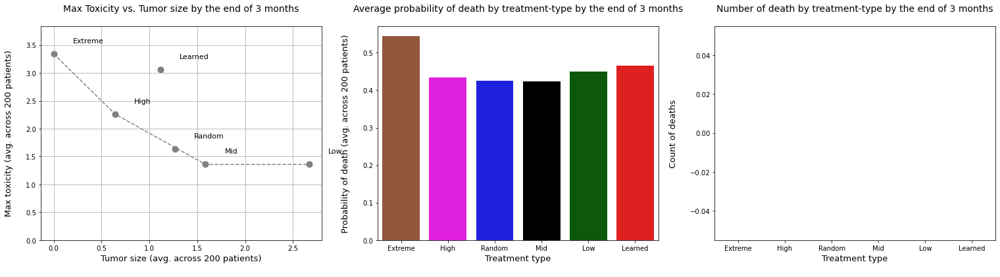

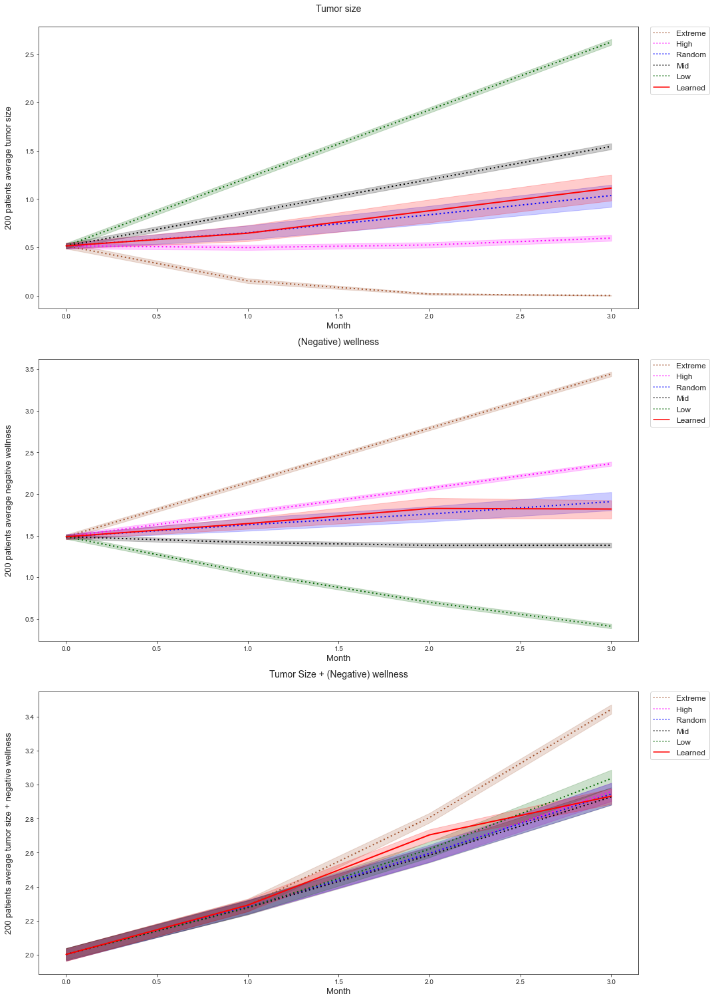


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.1130956971909074
                         - Avg. max. toxicity : 3.0609792491994905
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4939293939648897
                         - Avg. prob. of death : 0.4652780228368366



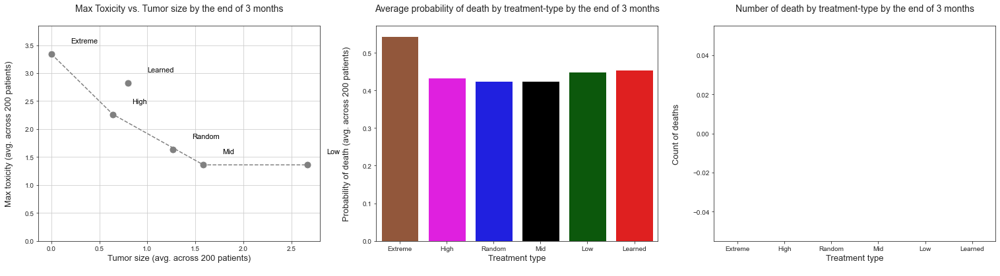

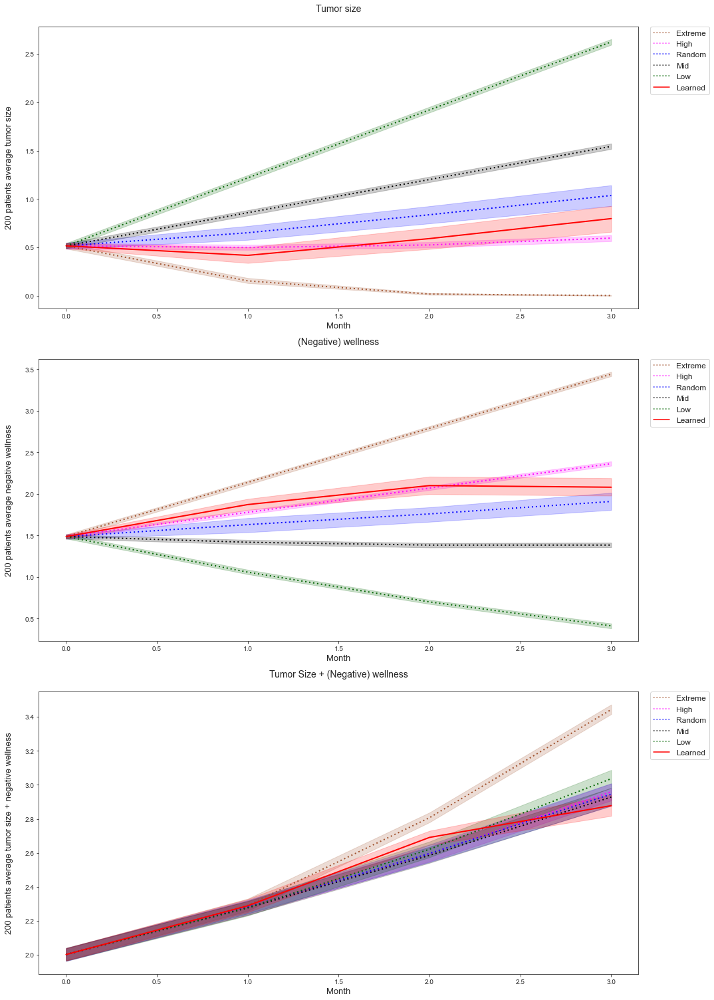


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.7974597564700793
                         - Avg. max. toxicity : 2.819556868303977
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4909437143026323
                         - Avg. prob. of death : 0.4554040542334794



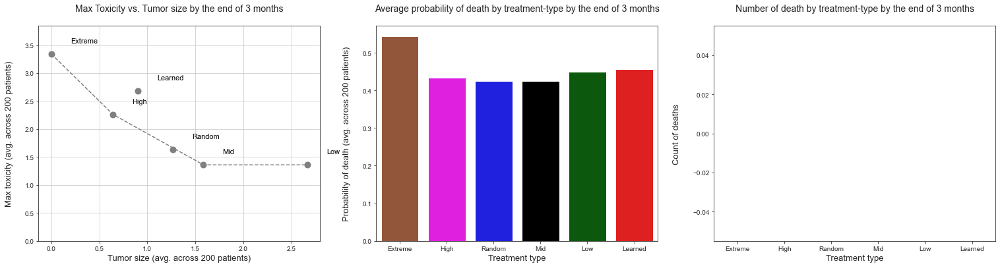

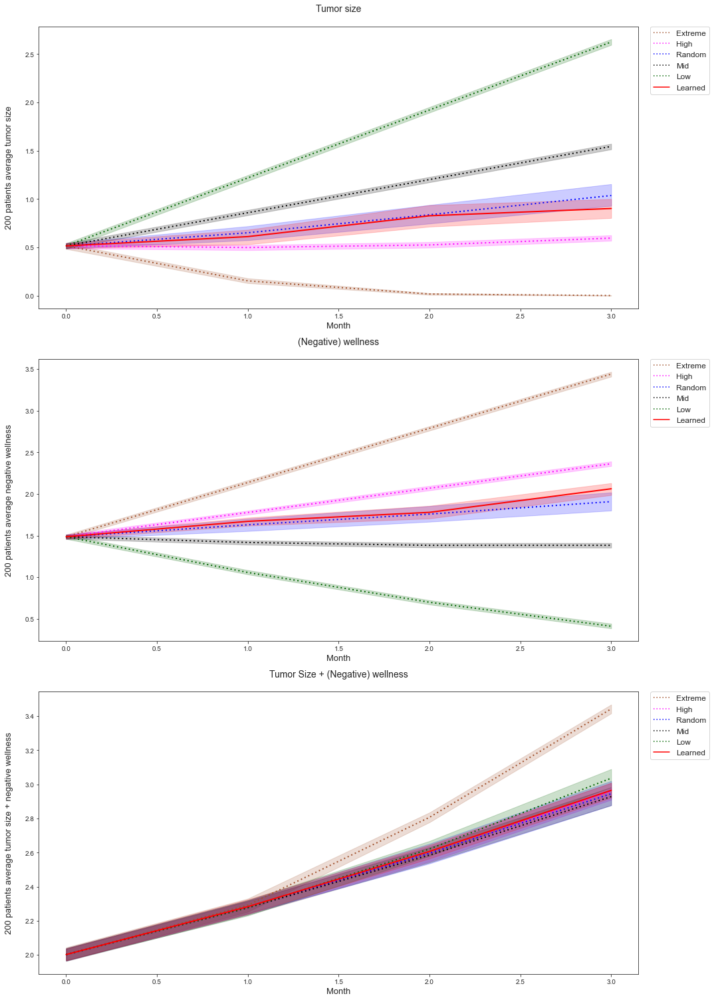


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 0.90205589292829
                         - Avg. max. toxicity : 2.683415924631617
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4908329224707164
                         - Avg. prob. of death : 0.4567582614584748



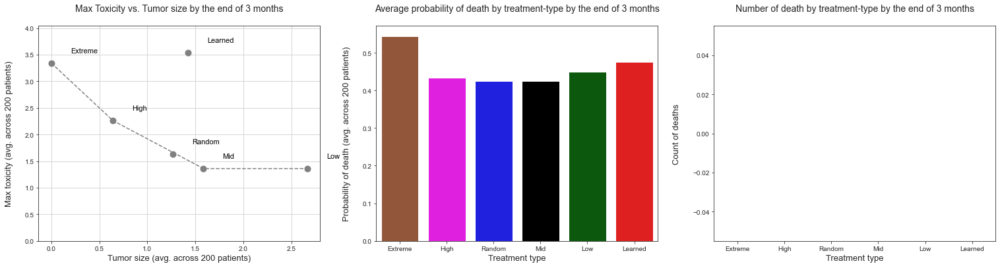

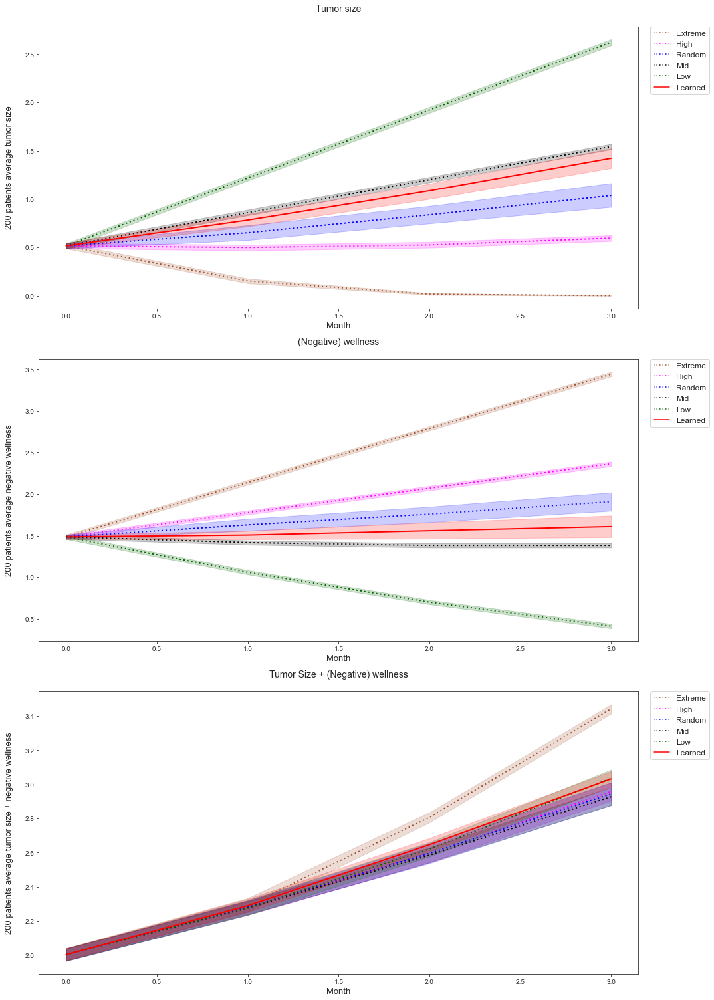


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 1.42308515003748
                         - Avg. max. toxicity : 3.5400260925618277
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4956055628557197
                         - Avg. prob. of death : 0.4757365054363975



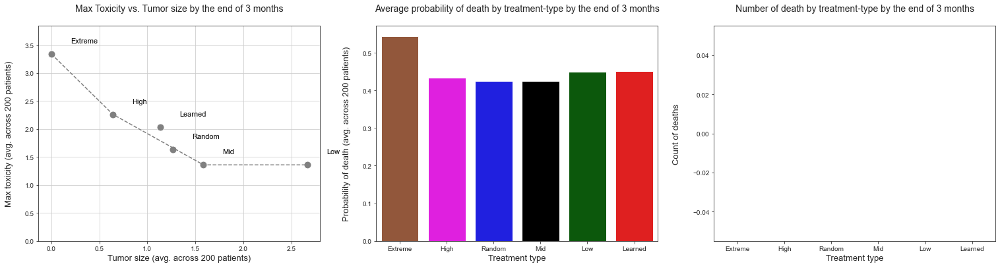

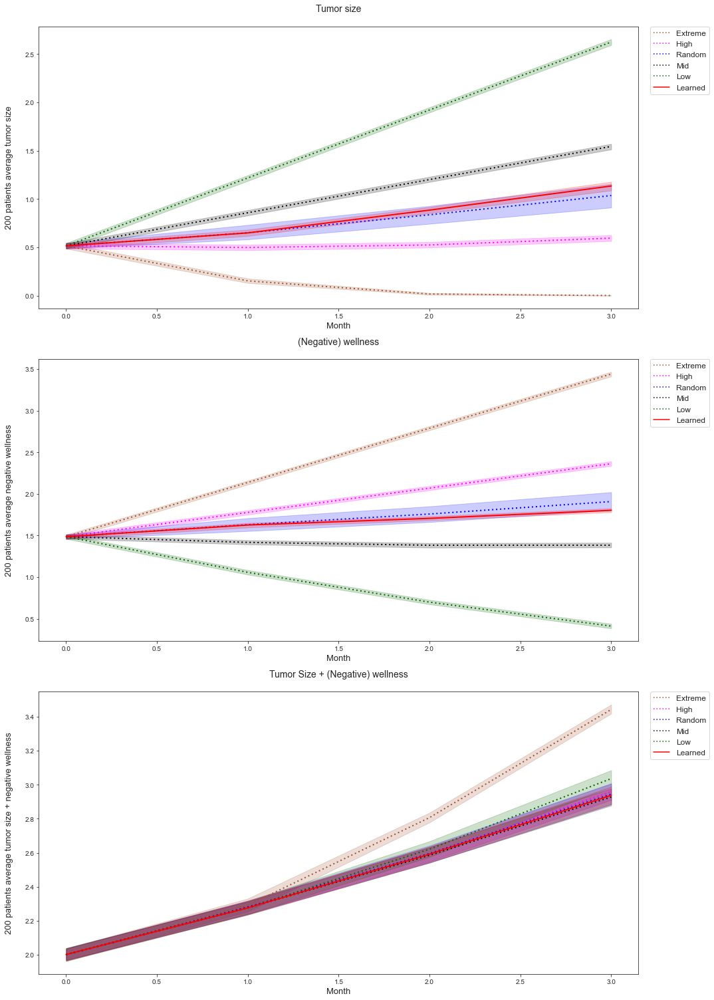


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 1.1349044240928707
                         - Avg. max. toxicity : 2.028961672495997
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4888142846772006
                         - Avg. prob. of death : 0.4504621883885492



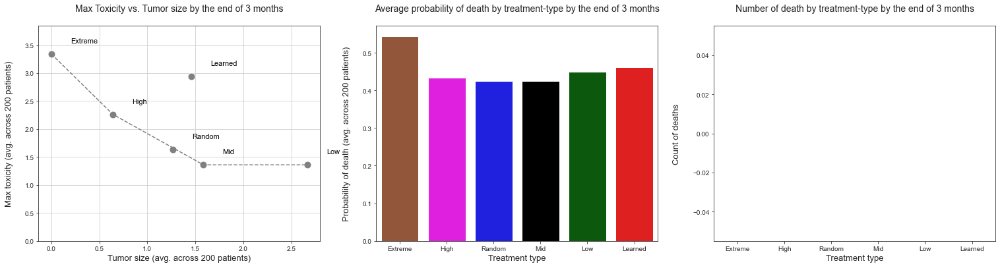

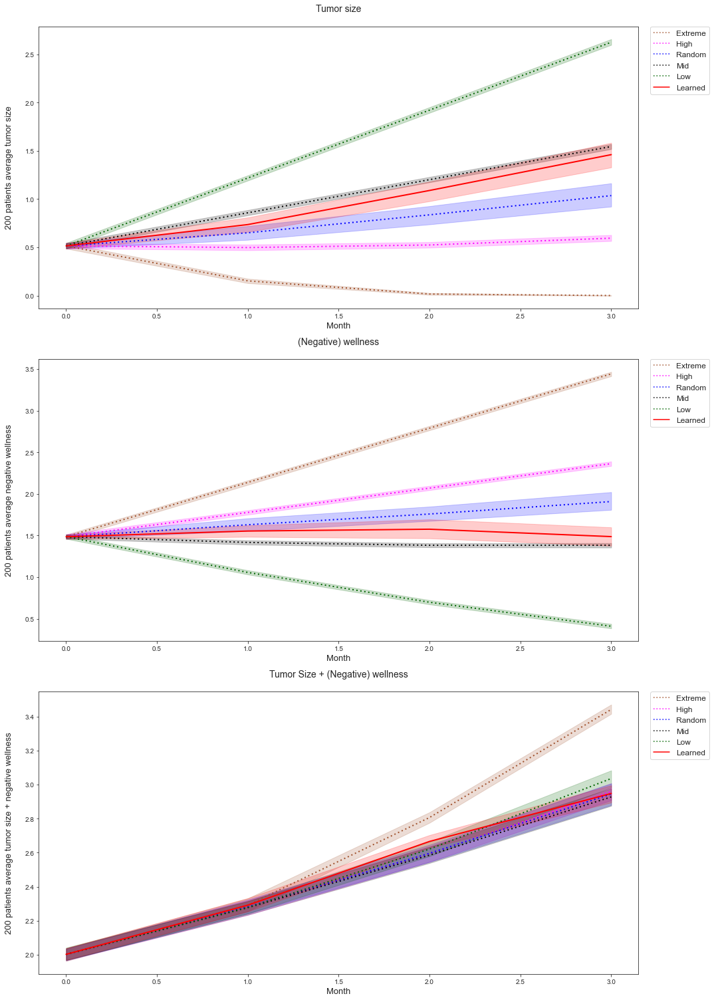


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 1.4605383242776662
                         - Avg. max. toxicity : 2.941354876631976
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4929579929509362
                         - Avg. prob. of death : 0.4623883457664742



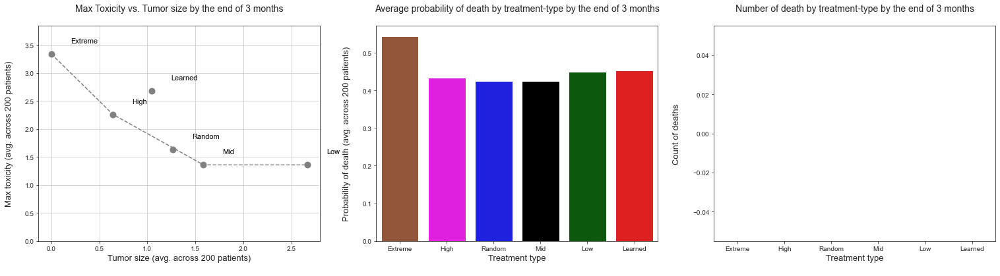

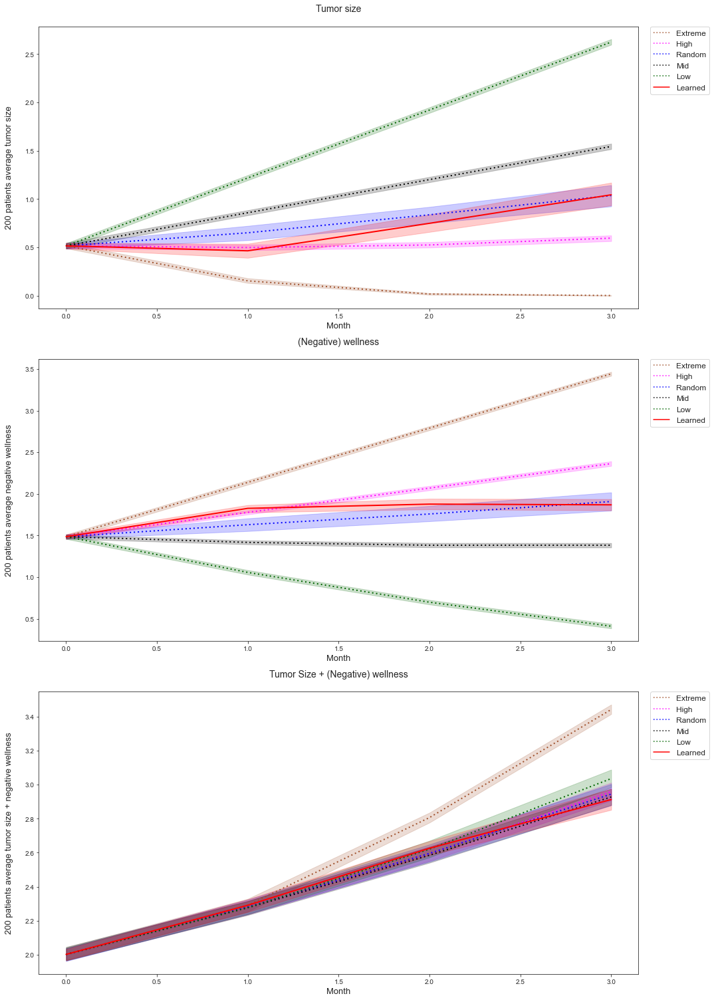


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 1.044088045235189
                         - Avg. max. toxicity : 2.6865205595769788
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.489820886938595
                         - Avg. prob. of death : 0.4524492386205746



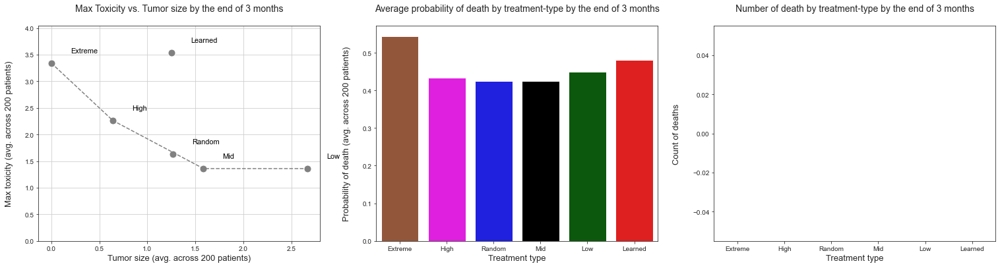

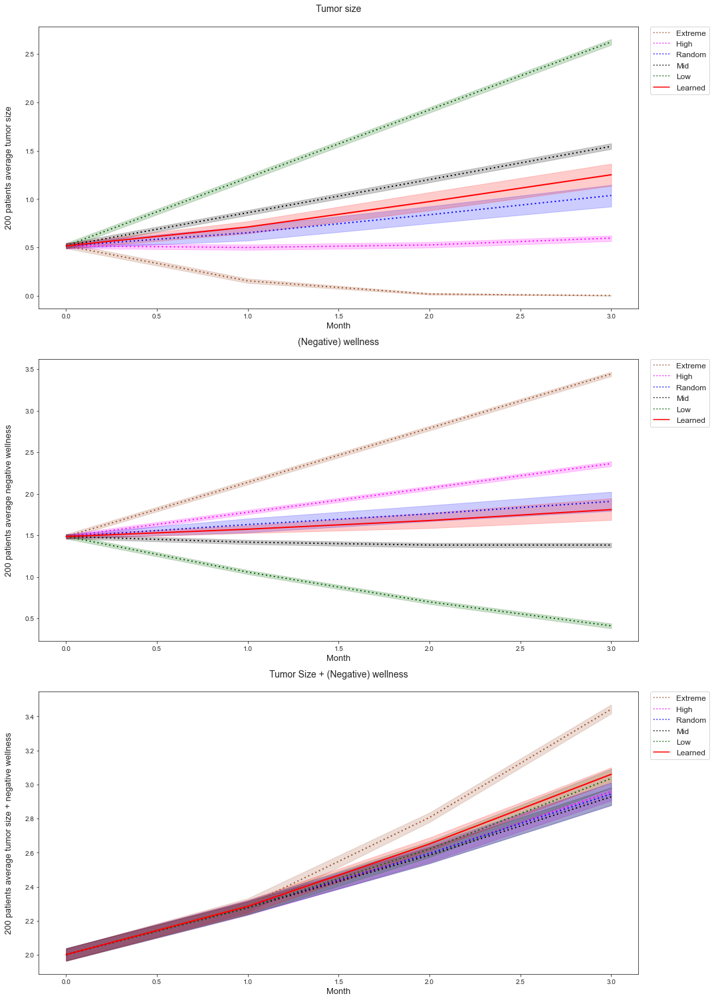


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 1.25041875288388
                         - Avg. max. toxicity : 3.5400260925618277
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.496762249216583
                         - Avg. prob. of death : 0.4814514092515145



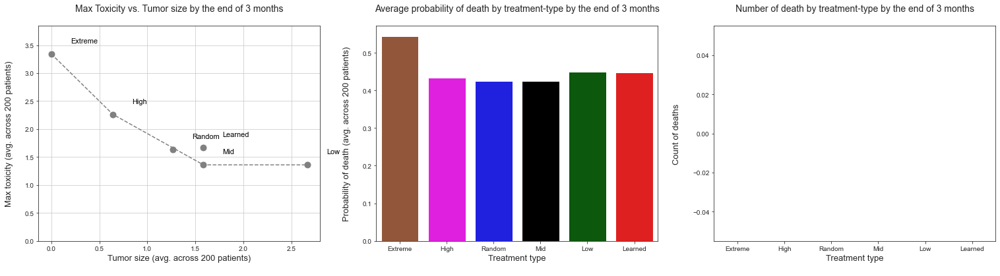

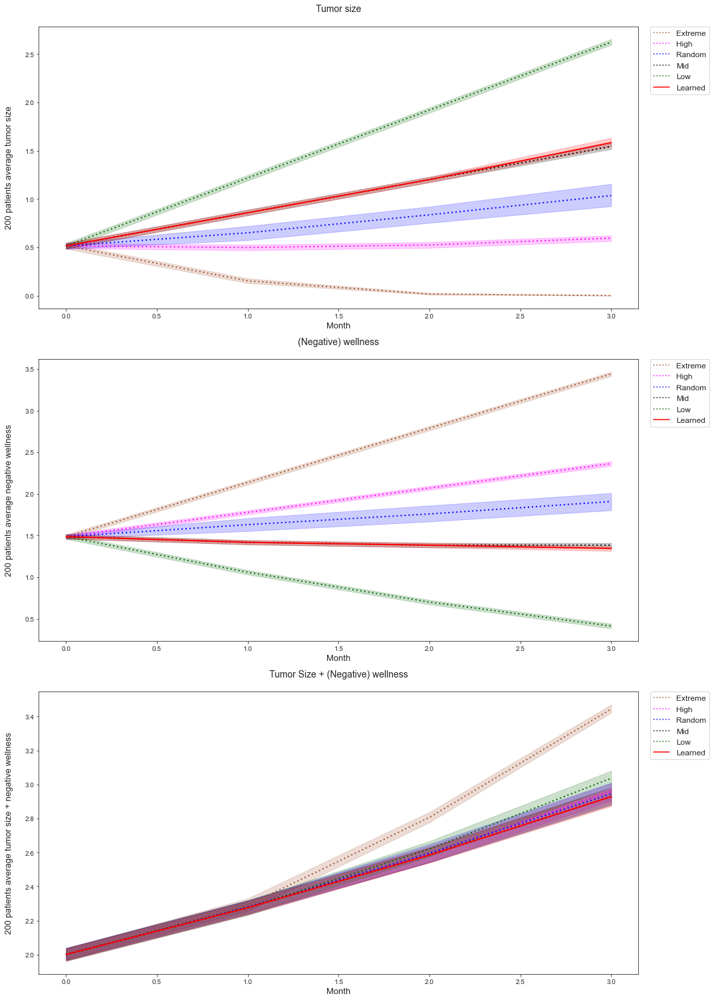


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 1.5839971868013845
                         - Avg. max. toxicity : 1.6734318064416576
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.488134606883864
                         - Avg. prob. of death : 0.44771488417664634



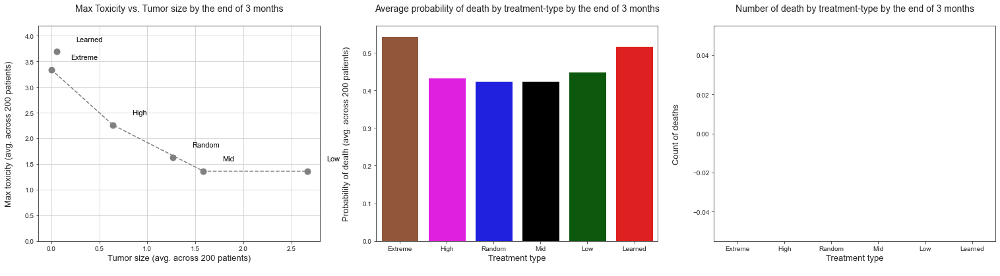

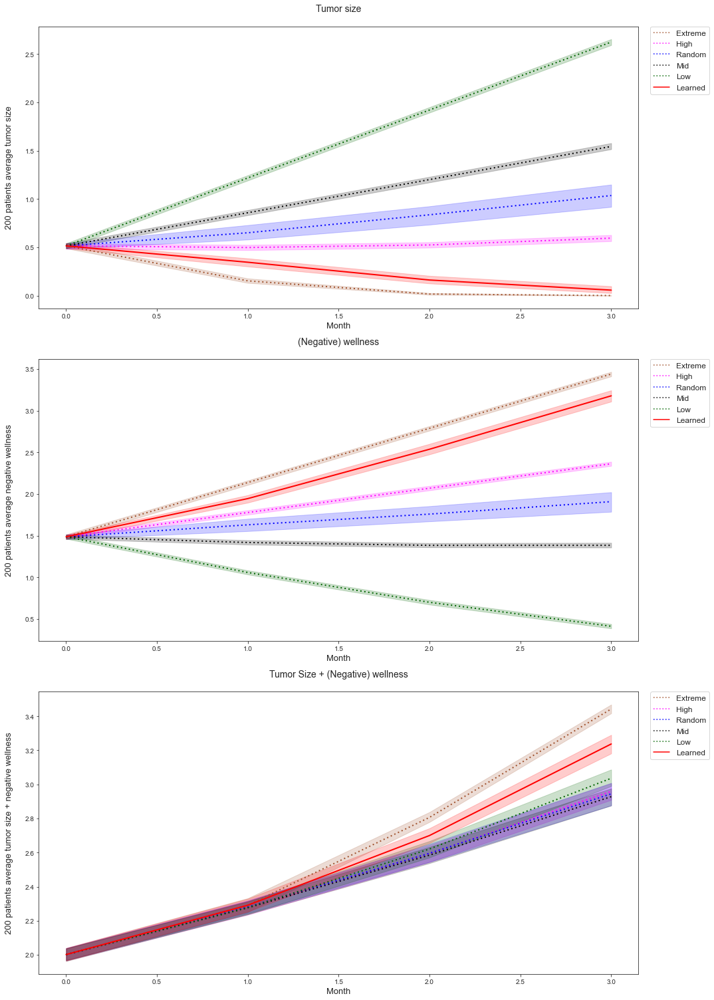


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 0.05765466388817233
                         - Avg. max. toxicity : 3.6931658788889807
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.5064373116626384
                         - Avg. prob. of death : 0.5180143439748103


Evaluations: 100%|██████████| 1/1 [2:44:59<00:00, 9899.25s/it]


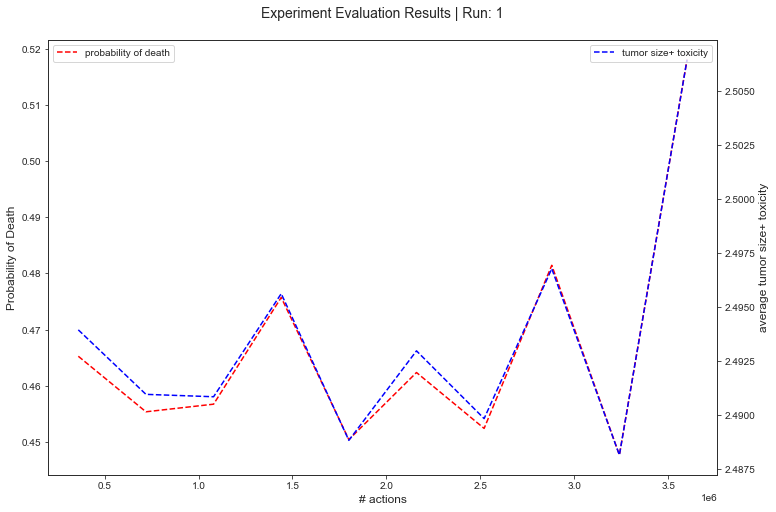

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 4
                                                , treatment_length_eval     = 4
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_2'
          , 'init_state_tag': 'g2'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 16


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


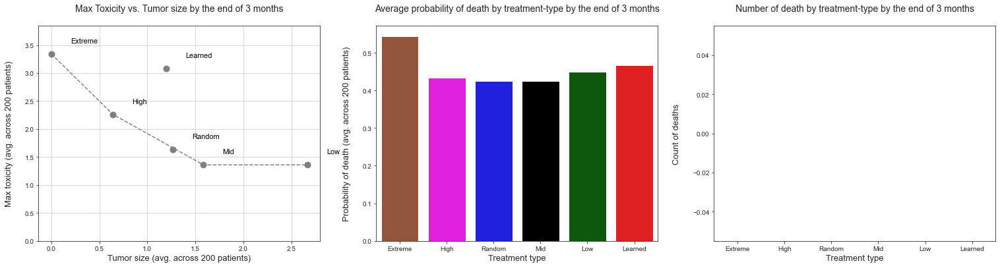

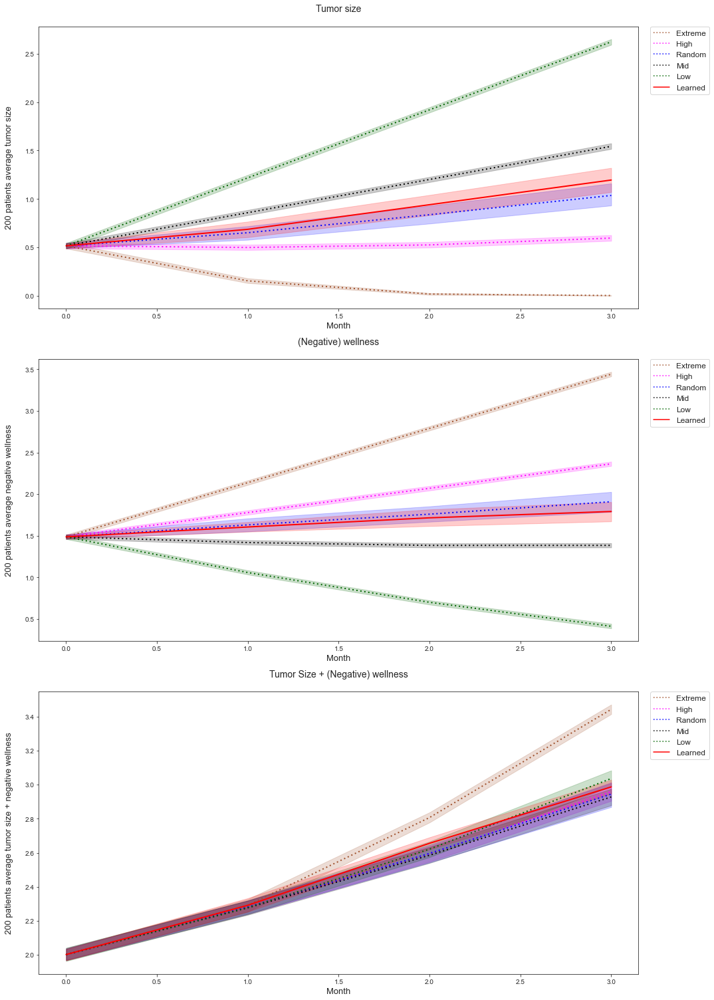


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 1.1957987776160397
                         - Avg. max. toxicity : 3.082025930775146
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4941445069526327
                         - Avg. prob. of death : 0.46676339603408434



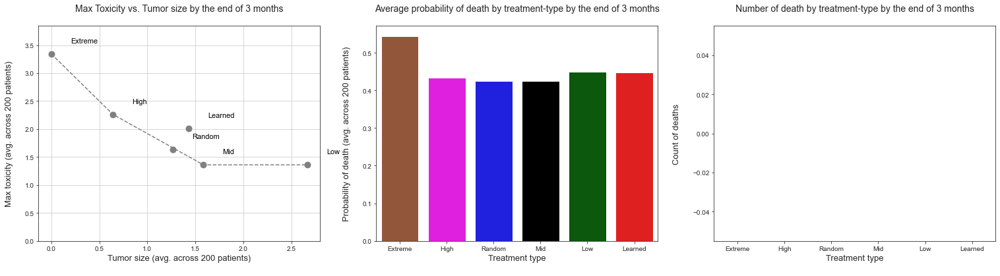

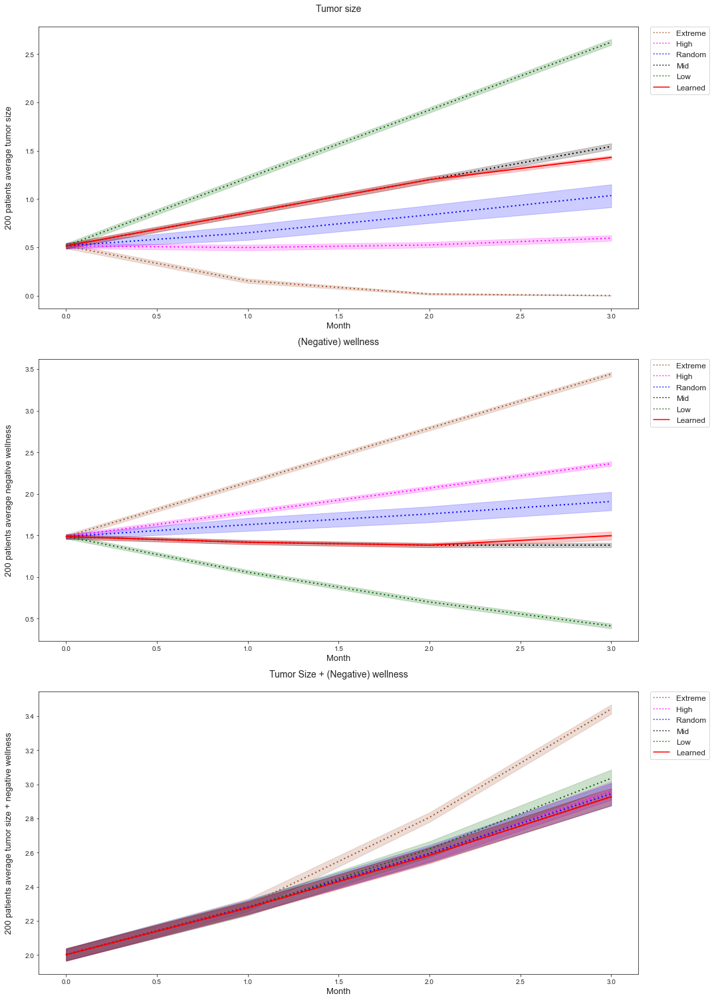


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 1.4309971868013835
                         - Avg. max. toxicity : 2.007361820864743
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.488134606883864
                         - Avg. prob. of death : 0.44771488417664634



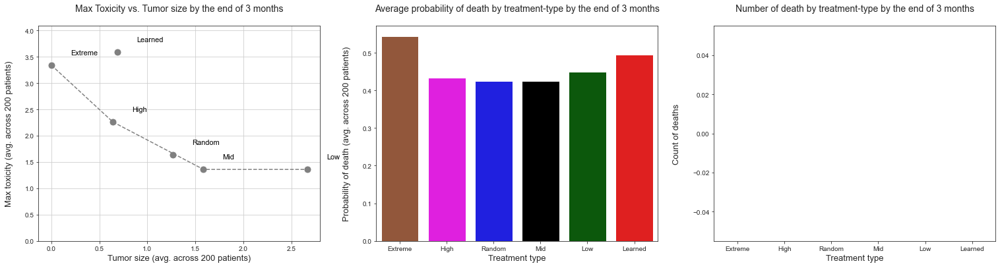

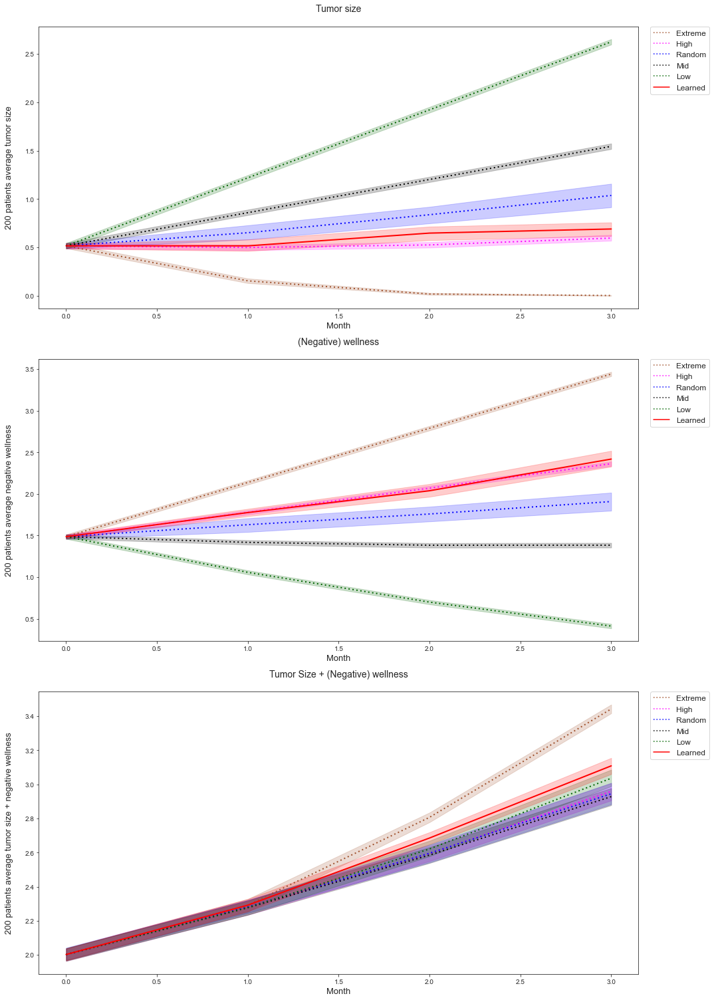


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 0.6896114016601237
                         - Avg. max. toxicity : 3.58751455296501
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.500464310998915
                         - Avg. prob. of death : 0.49586079019219326



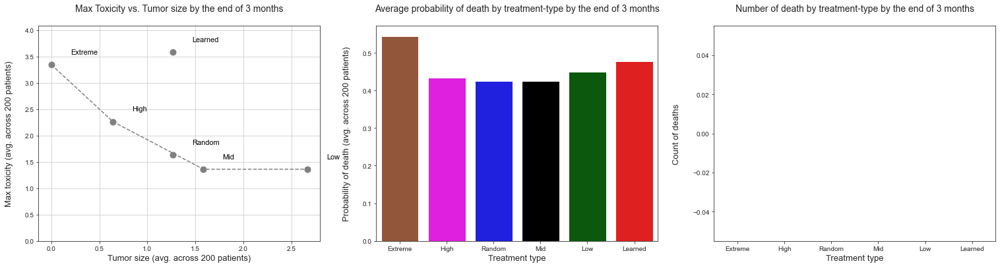

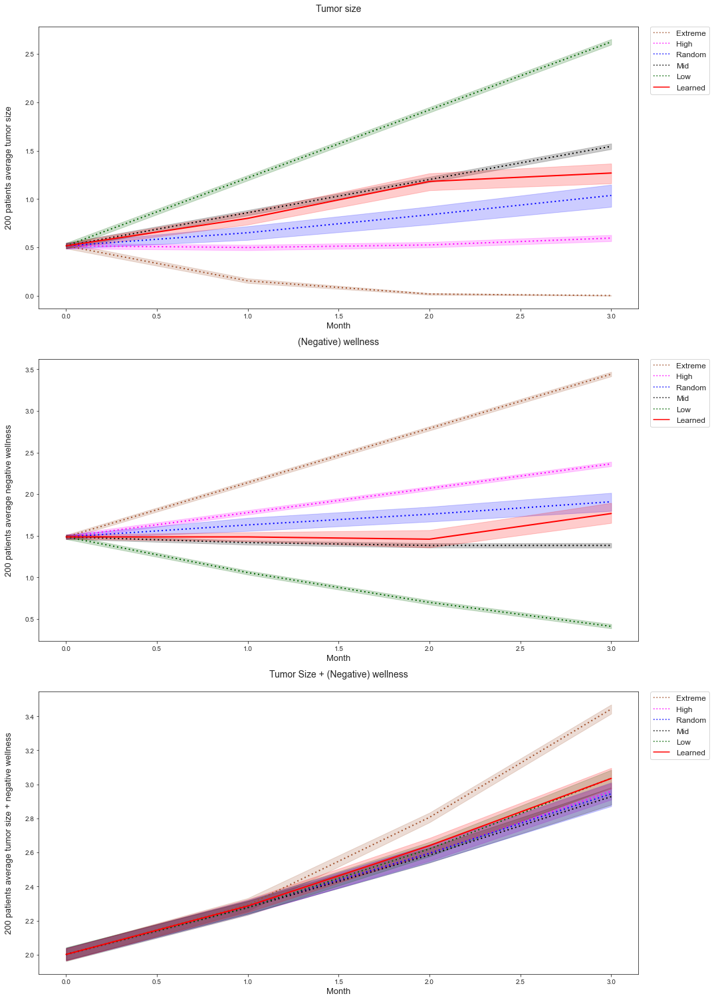


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 1.2682945957504144
                         - Avg. max. toxicity : 3.575877238642882
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4953152067347095
                         - Avg. prob. of death : 0.47699674305337736



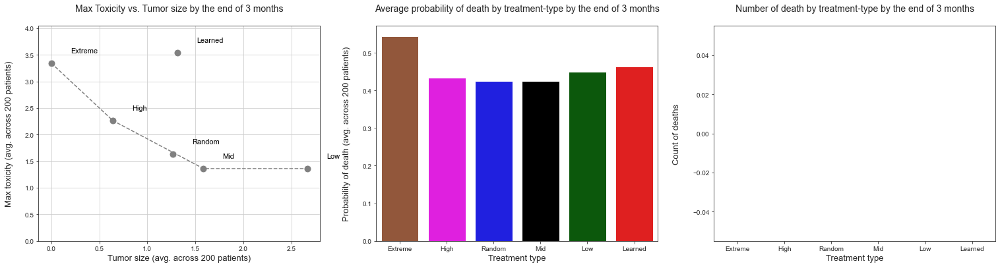

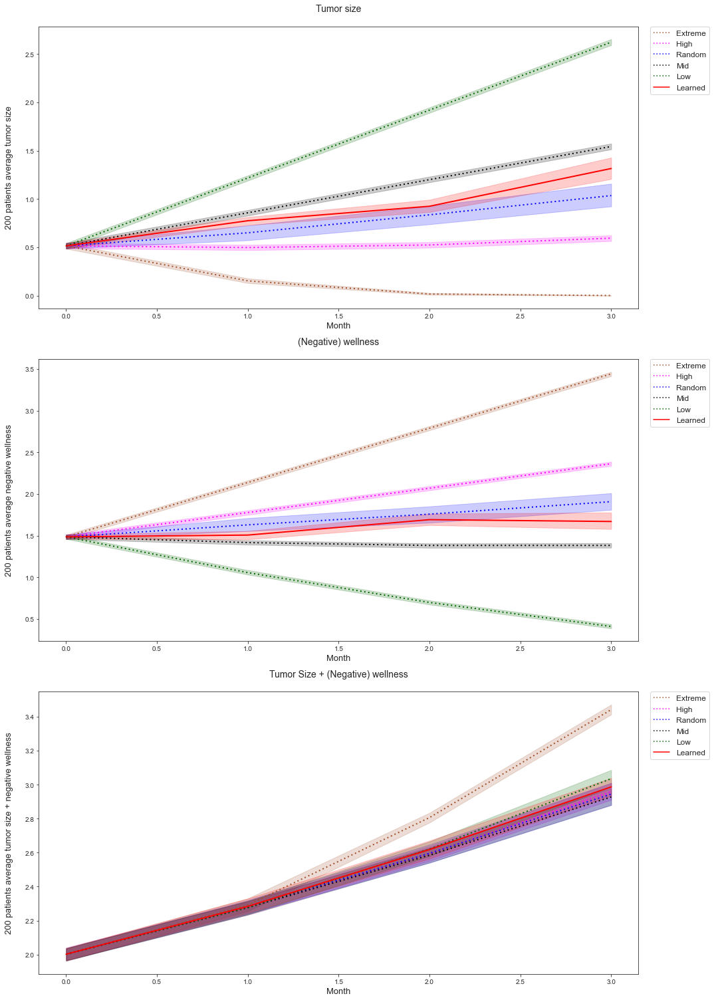


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 1.3167021074615313
                         - Avg. max. toxicity : 3.541660517768688
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.492289181952609
                         - Avg. prob. of death : 0.4643434719487162



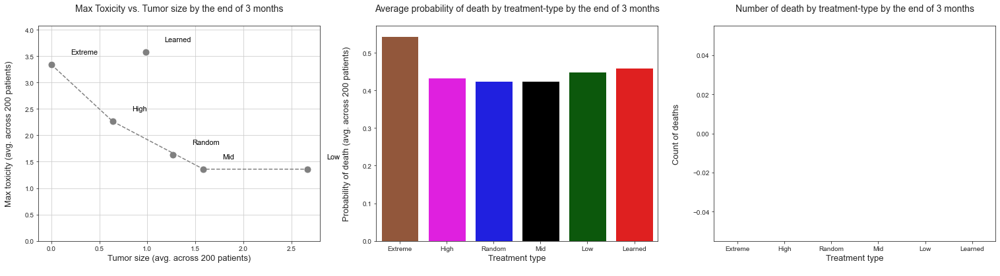

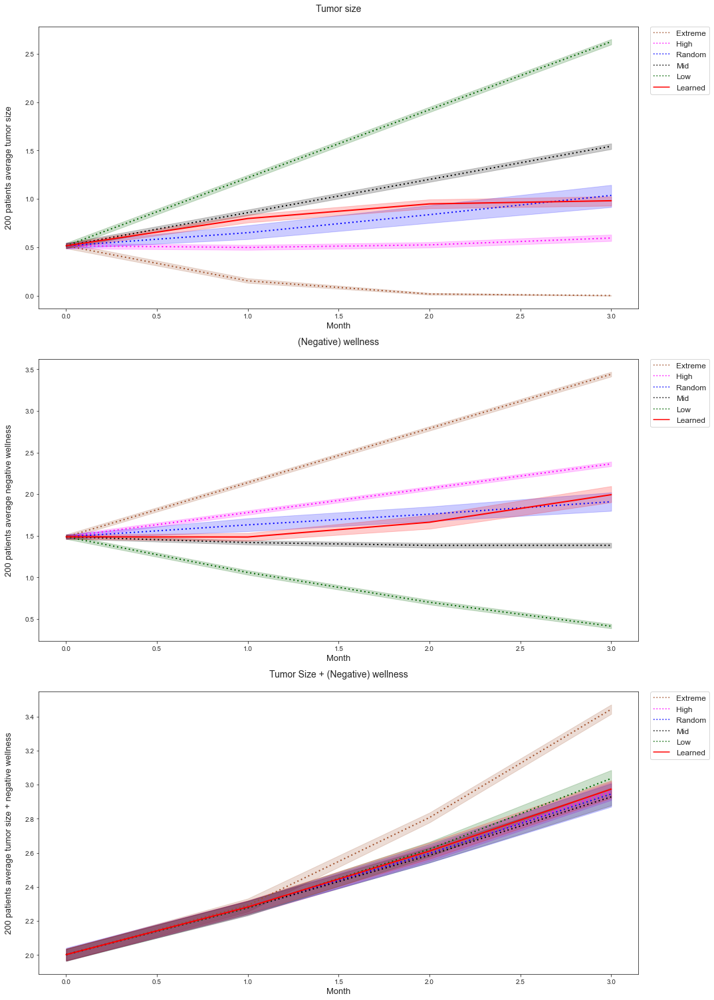


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 0.980979554747637
                         - Avg. max. toxicity : 3.5732816884595993
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.491287938780763
                         - Avg. prob. of death : 0.46078194949308143



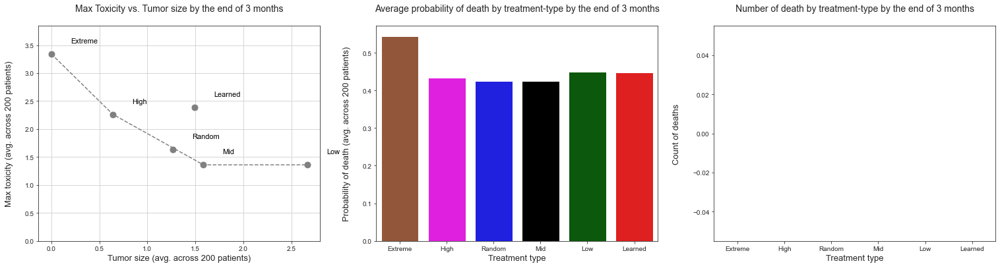

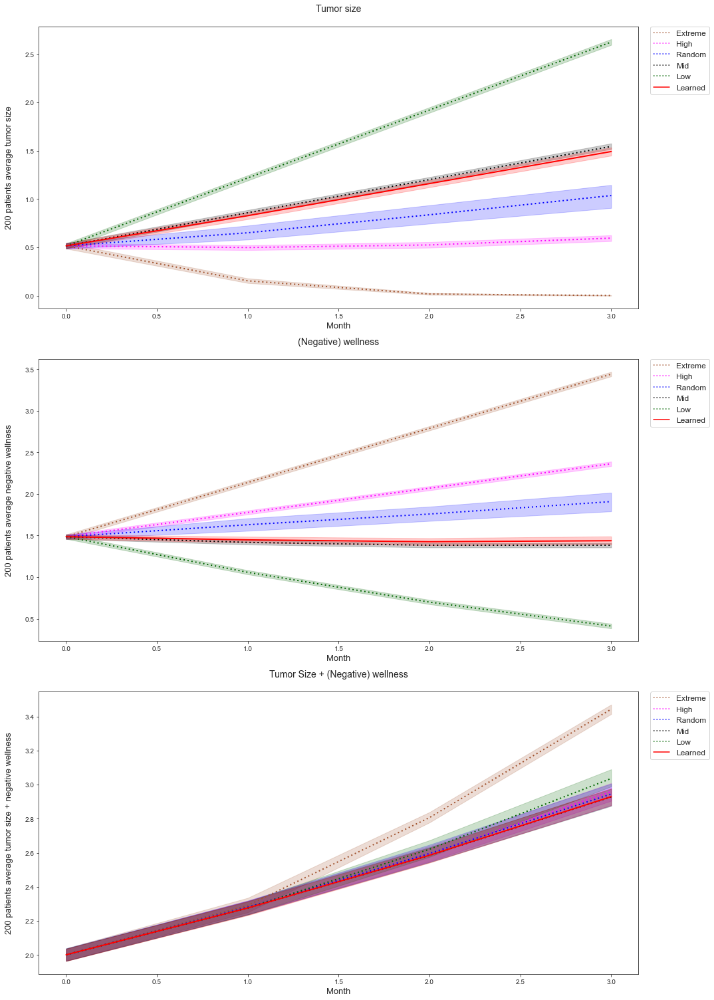


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 1.4916887807529724
                         - Avg. max. toxicity : 2.384519071626171
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4882159950091487
                         - Avg. prob. of death : 0.44808722181508687



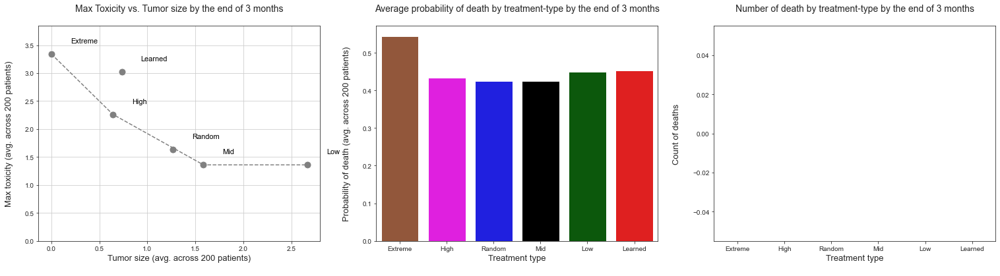

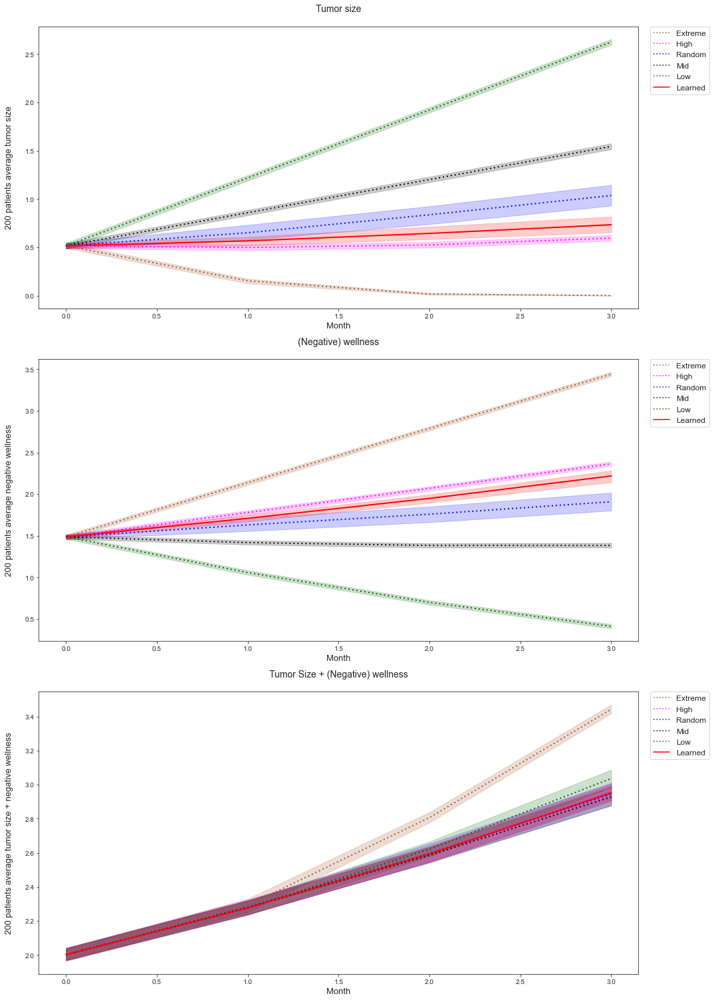


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 0.7339271915304743
                         - Avg. max. toxicity : 3.0219680136103113
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4894454033854627
                         - Avg. prob. of death : 0.45319638123273825



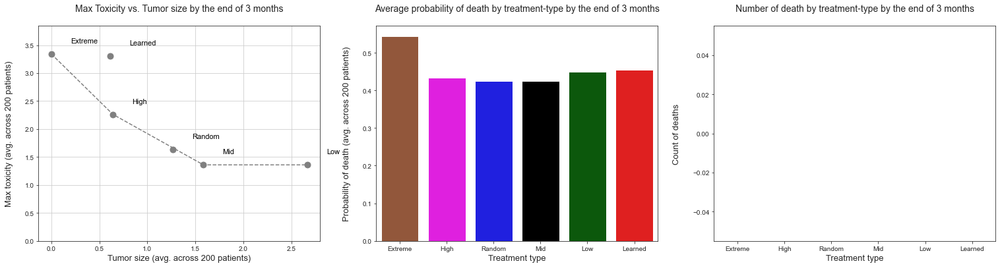

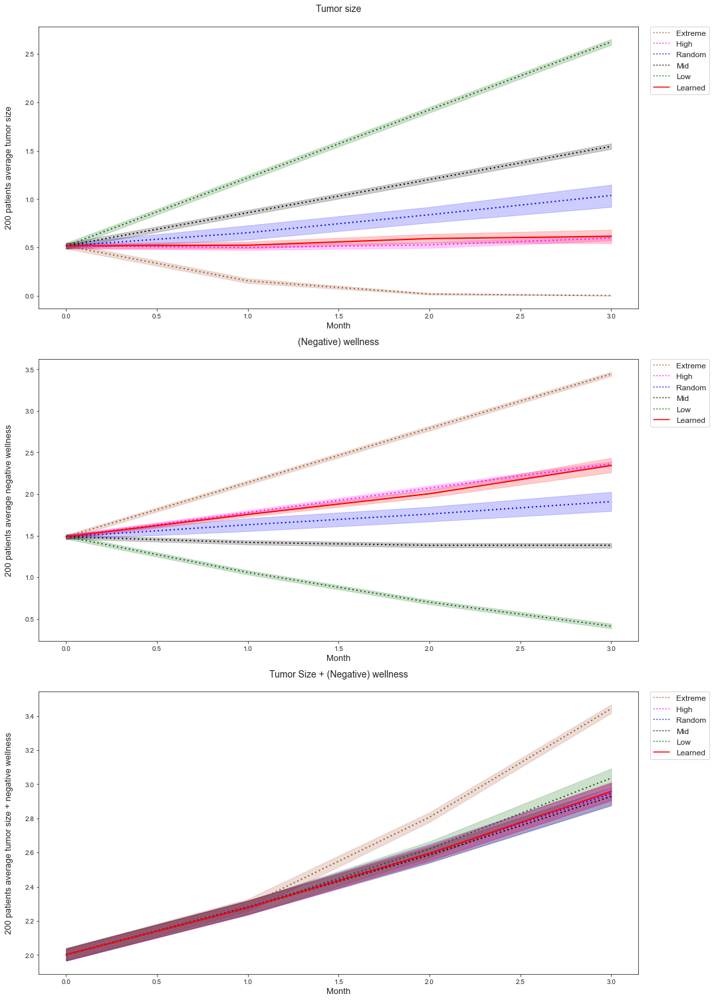


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 0.6136221381513945
                         - Avg. max. toxicity : 3.302953646995067
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.4897130746929337
                         - Avg. prob. of death : 0.45447296874828



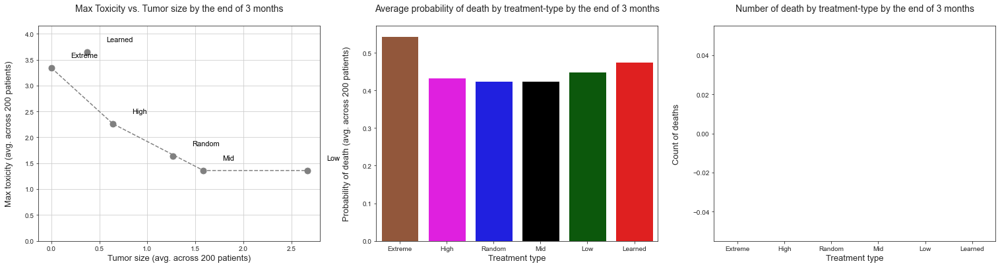

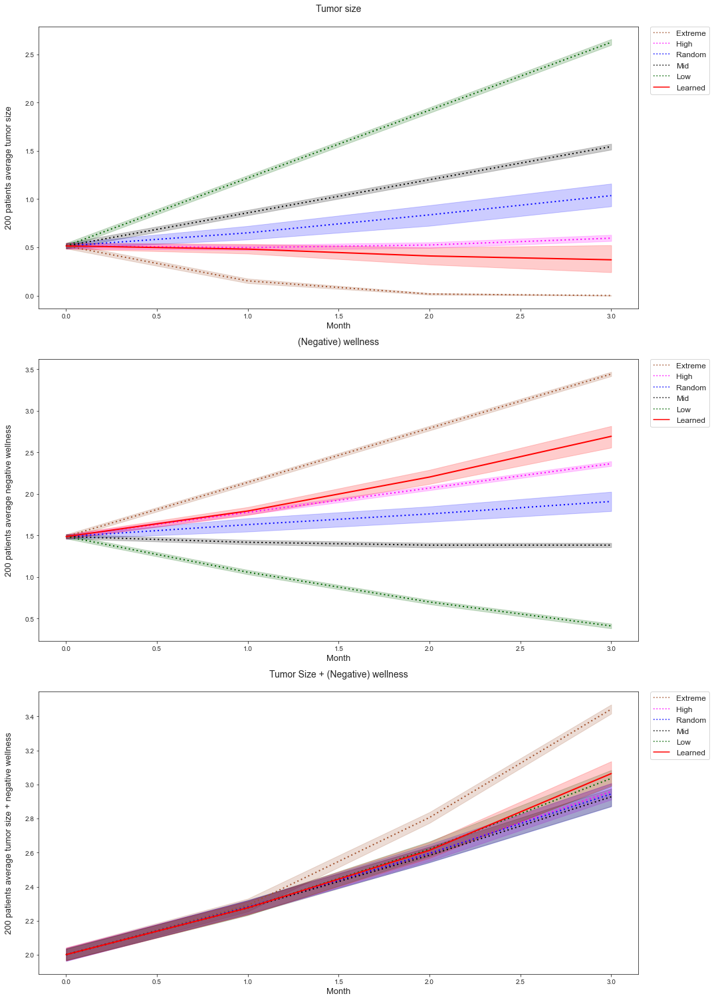


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 0.37186881658108234
                         - Avg. max. toxicity : 3.651065098627074
                         - Avg. tumor size + toxicity (at the end of 3 months): 2.495015993075171
                         - Avg. prob. of death : 0.47524549956555195


Evaluations: 100%|██████████| 1/1 [2:01:20<00:00, 7280.21s/it]


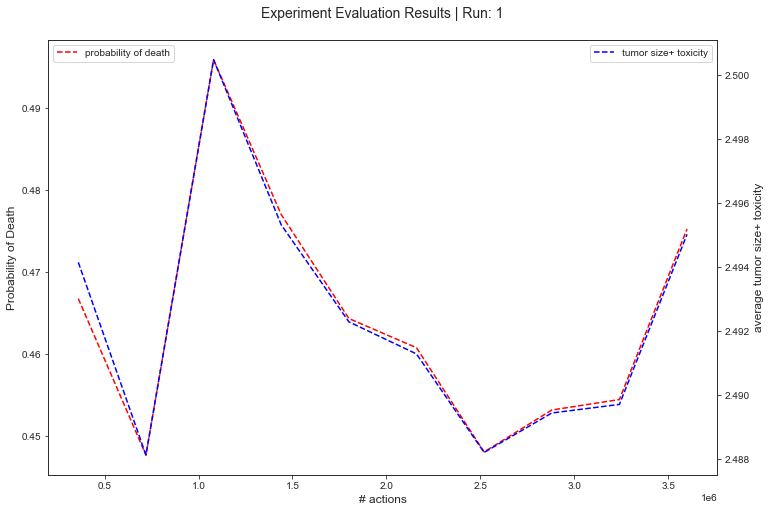

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 4
                                                , treatment_length_eval     = 4
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()